# Price Prediction with Neural Network

# Data Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

raw_listings = pd.read_csv('nov2020/listings.csv')
# Shape: (76984, 74)

# Beginning Data Cleaning: Consistent across our different models

Displaying data

In [2]:
pd.set_option("display.max_columns", raw_listings.shape[1]) #
print(raw_listings.shape)
raw_listings.head()

(76984, 74)


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,https://www.airbnb.com/rooms/11551,20201106040109,2020-11-07,Arty and Bright London Apartment in Zone 2,Unlike most rental apartments out there my fla...,Not even 10 minutes by metro from Victoria Sta...,https://a0.muscache.com/pictures/b7afccf4-18e5...,43039,https://www.airbnb.com/users/show/43039,Adriano,2009-10-03,"London, England, United Kingdom","Hello, I'm a friendly Italian man with a very ...",within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/47773...,https://a0.muscache.com/im/pictures/user/47773...,Brixton,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"London, United Kingdom",Lambeth,NaN,51.46225,-0.11732,Entire apartment,Entire home/apt,4,NaN,1 bath,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",$97.00,7,190,7,28,1125,1125,8.4,1125.0,NaN,t,0,0,4,279,2020-11-07,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,NaN,t,2,2,0,0,1.48
1,13913,https://www.airbnb.com/rooms/13913,20201106040109,2020-11-07,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,https://www.airbnb.com/users/show/54730,Alina,2009-11-16,"London, England, United Kingdom",I am a Multi-Media Visual Artist and Creative ...,within a day,83%,71%,f,https://a0.muscache.com/im/users/54730/profile...,https://a0.muscache.com/im/users/54730/profile...,LB of Islington,3.0,3.0,"['email', 'phone', 'facebook', 'reviews', 'off...",t,t,"Islington, Greater London, United Kingdom",Islington,NaN,51.56802,-0.11121,Private room in apartment,Private room,2,NaN,1 shared bath,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",$40.00,1,29,1,28,29,29,2.8,29.0,NaN,t,30,60,90,365,2020-11-07,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,NaN,f,2,1,1,0,0.17
2,15400,https://www.airbnb.com/rooms/15400,20201106040109,2020-11-07,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,It is Chelsea.,https://a0.muscache.com/pictures/428392/462d26...,60302,https://www.airbnb.com/users/show/60302,Philippa,2009-12-05,"Kensington, England, United Kingdom","English, grandmother, I have travelled quite ...",within a day,100%,100%,f,https://a0.muscache.com/im/users/60302/profile...,https://a0.muscache.com/im/users/60302/profile...,Chelsea,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"London, United Kingdom",Kensington and Chelsea,NaN,51.48796,-0.16898,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",$75.00,10,50,10,28,50,50,11.2,50.0,NaN,t,0,20,50,150,20

In [3]:
pd.set_option("display.max_rows", raw_listings.shape[0])
raw_listings.isnull().sum().sort_values(ascending=False)

neighbourhood_group_cleansed                    76984
license                                         76984
bathrooms                                       76984
calendar_updated                                76984
host_response_time                              37618
host_response_rate                              37618
host_about                                      33765
neighborhood_overview                           29148
neighbourhood                                   29147
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                 

# Missing Data

<AxesSubplot:>

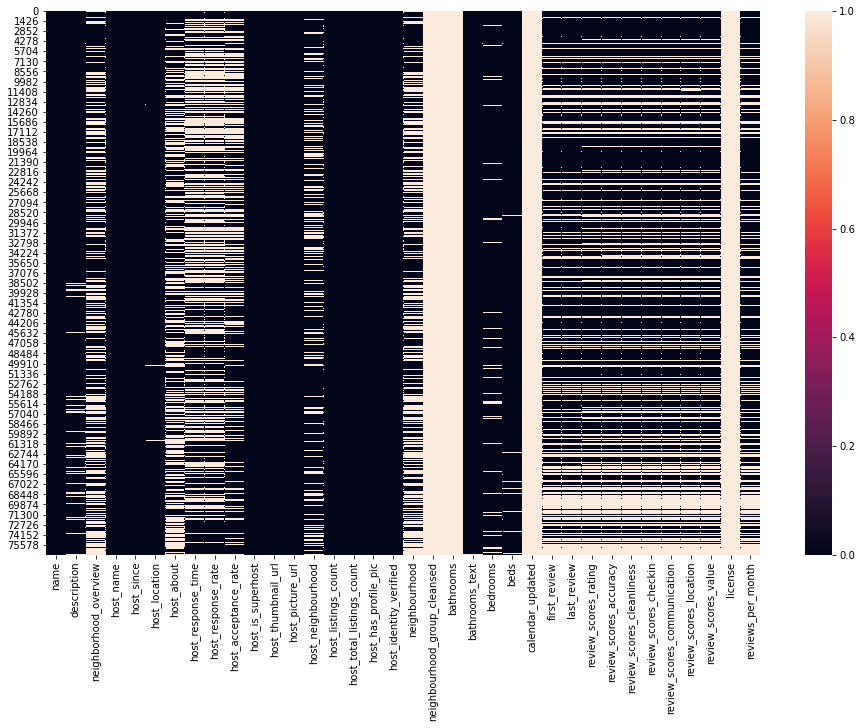

In [4]:
missing_val_cols = raw_listings.columns[raw_listings.isnull().sum() > 0]
fig, ax = plt.subplots(figsize=(16,10)) 
sns.heatmap(raw_listings[missing_val_cols].isnull(), cbar=True)

# Dropping unnecessary columns

In [5]:
to_drop = ['listing_url', 'scrape_id', 'name', 'description', 'neighborhood_overview', 'picture_url',
              'host_url', 'host_name', 'host_location', 'host_about', 'host_thumbnail_url', 
               'host_verifications', 'neighbourhood', 'neighbourhood_group_cleansed',
               'bathrooms', 'calendar_updated', 'calendar_last_scraped', 'license', 'host_picture_url', 
               'host_neighbourhood', #'host_response_time'
              ]

listings = raw_listings.drop(to_drop, axis=1)

Printing missing value sums for each remaining column in dataframe.

In [6]:
#Print out the sum of missing values for every column. 
#While we've dropped free text columns, we still need to do a lot of work in regards to missing data.
print(listings.shape)
listings.isna().sum().sort_values(ascending=False)

(76984, 54)


host_response_time                              37618
host_response_rate                              37618
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                                     21733
reviews_per_month                               21733
bedrooms                                         4746
beds                                             1080
bathrooms_text                                    160
host_total_listings_count                          11
host_identity_verified                             11
host_has_profile_pic        

Viewing maximum and minimum nights columns, dropping them, and describing the updated dataframe.

In [7]:
# Minimum and maximum nights columns

print(100 * sum(listings.maximum_nights_avg_ntm == listings.maximum_nights) / len(listings)) 
print(100 * sum(listings.maximum_maximum_nights == listings.maximum_nights) / len(listings))

listings = listings.drop(['maximum_nights_avg_ntm', 'minimum_minimum_nights', 'minimum_maximum_nights',
                          'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights',
                          'minimum_nights_avg_ntm'], axis=1)
print(listings.shape)
listings.describe().T

86.78946274550556
87.77797983996675
(76984, 48)


,count,mean,std,min,25%,50%,75%,max
id,76984.0,2.562503e+07,1.319053e+07,11551.00000,1.509091e+07,2.585057e+07,3.760606e+07,4.626152e+07
host_id,76984.0,9.517164e+07,1.001727e+08,2010.00000,1.612489e+07,4.947226e+07,1.529558e+08,3.745225e+08
host_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
host_total_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
latitude,76984.0,5.150993e+01,4.751437e-02,51.28337,5.148414e+01,5.151403e+01,5.153924e+01,5.168523e+01
longitude,76984.0,-1.282558e-01,9.481499e-02,-0.49687,-1.886225e-01,-1.260000e-01,-6.948000e-02,2.885700e-01
accommodates,76984.0,3.077393e+00,1.947671e+00,1.00000,2.000000e+00,2.000000e+00,4.000000e+00,1.600000e+01
bedrooms,72238.0,1.487818e+00,8.849293e-01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
beds,75904.0,1.706814e+00,1.275783e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
minimum_nights,76984.0,5.142120e+00,2.247701e+01,1.00000,1.000000e+00,2.000000e+00,3.000000e+00,1.125000e+03


Examining dataframe

In [8]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76984 entries, 0 to 76983
Data columns (total 48 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            76984 non-null  int64  
 1   last_scraped                                  76984 non-null  object 
 2   host_id                                       76984 non-null  int64  
 3   host_since                                    76973 non-null  object 
 4   host_response_time                            39366 non-null  object 
 5   host_response_rate                            39366 non-null  object 
 6   host_acceptance_rate                          48552 non-null  object 
 7   host_is_superhost                             76973 non-null  object 
 8   host_listings_count                           76973 non-null  float64
 9   host_total_listings_count                     76973 non-null 

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'host_id'}>,
        <AxesSubplot:title={'center':'host_is_superhost'}>,
        <AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'host_has_profile_pic'}>],
       [<AxesSubplot:title={'center':'host_identity_verified'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'has_availability'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'av

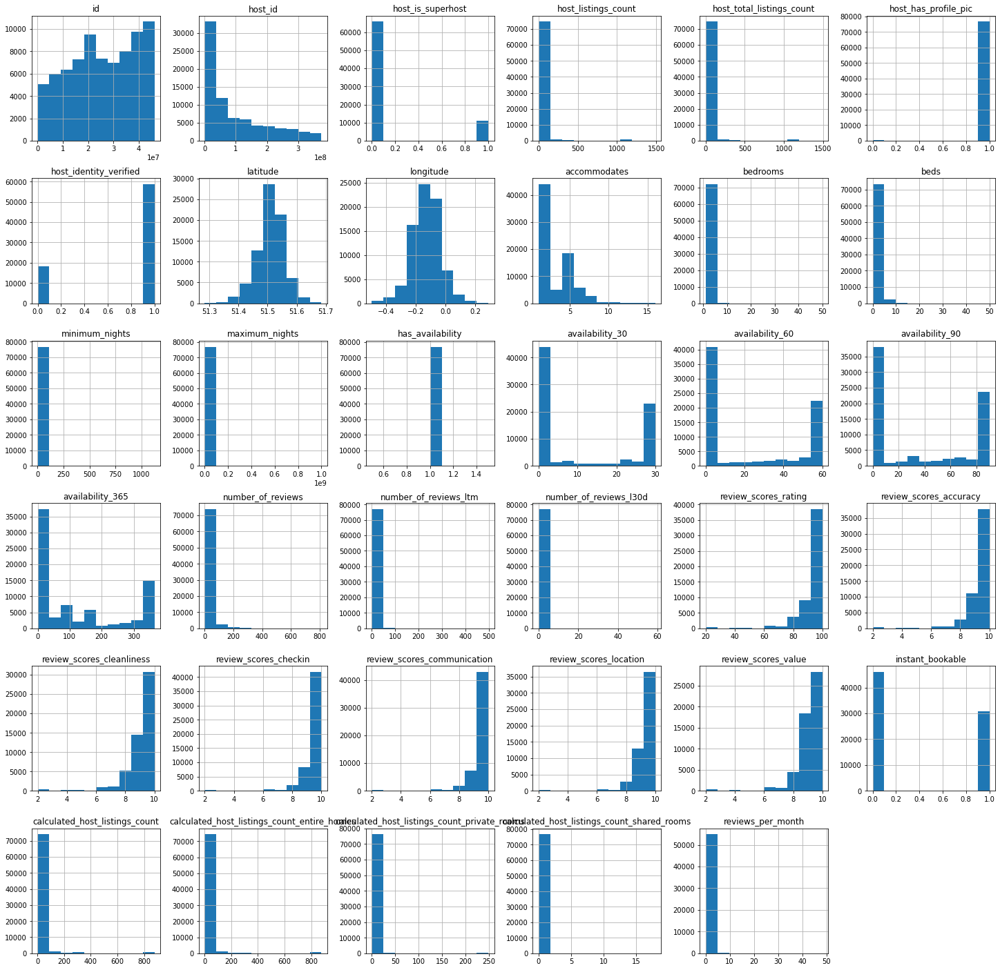

In [9]:
#Check if boolean and numeric columns have enough varibility to make them worth including

# Replace columns with categorical values t and f with 1 and 0
listings = listings.replace({'f': 0, 't': 1})

# Plot the histogram of numerical and boolean columns
listings.hist(figsize=(25, 25))

Using a lambda function to remove special characters, converting to float.

In [10]:
strip_and_convert = lambda col: col.str.extract('(\d+)', expand=False).astype(float, errors='ignore')

# strip_and_convert function wil be applied on the below columns
cols_to_numeric = ['host_response_rate', 'host_acceptance_rate', 'bathrooms_text', 'price']
listings[cols_to_numeric] = listings[cols_to_numeric].apply(strip_and_convert)
# Rename bathrooms_text column
listings = listings.rename(columns={'bathrooms_text': 'bathrooms'})
print(listings.shape)
listings.head()

(76984, 48)


,id,last_scraped,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,2020-11-07,43039,2009-10-03,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,1,2,2,0,0,1.48
1,13913,2020-11-07,54730,2009-11-16,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,0,2,1,1,0,0.17
2,15400,2020-11-07,60302,2009-12-05,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,9.0,1,1,1,0,0,0.67
3,17402,2020-11-06,67564,2010-01-04,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ...",307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,9.0,0,15,15,0,0,0.36
4,17506,2020-11-07,67915,2010-01-05,NaN,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,"[""TV"", ""Heating"", ""Shower gel"", ""Wifi"", ""Smoke...",150.0,3,21,1,29,59,89,364,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0,2,0,NaN


Removing unnecessary host-related columns

In [11]:
listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

#Since it's a small number, we will drop these rows.
listings = listings.dropna(subset=['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified'], axis=0)

listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

print(listings.shape)


(76973, 48)


Feature engineering: in order to use the host_sine column (which contains dates in YYYY-MM-DD format), transforming the coumn to numerical.  The replacement will be the difference in days between the date the dataset was scraped and the host_since column.

In [12]:
# Convert to datetime object
listings['last_scraped'] = pd.to_datetime(listings['last_scraped'])
listings['host_since'] = pd.to_datetime(listings['host_since'])

#Created a new feature to calculate the difference in days:
listings['days_host_since'] = (listings['last_scraped'] - listings['host_since']).dt.days

# Remove host_since and other unnecessary columns
listings = listings.drop(['host_since', 'id', 'host_id'], axis=1)

listings['days_host_since'].describe()

count    76973.000000
mean      1755.958739
std        845.728491
min          2.000000
25%       1130.000000
50%       1807.000000
75%       2342.000000
max       4468.000000
Name: days_host_since, dtype: float64

# Property Type

Entire apartment                      0.419615
Private room in apartment             0.233225
Private room in house                 0.144674
Entire house                          0.073207
Private room in townhouse             0.020163
Entire condominium                    0.015213
Entire townhouse                      0.012680
Entire serviced apartment             0.012550
Private room in condominium           0.008081
Private room in bed and breakfast     0.006808
Entire loft                           0.005573
Room in boutique hotel                0.005560
Shared room in apartment              0.003858
Room in serviced apartment            0.003858
Room in hotel                         0.003781
Private room in loft                  0.003313
Private room in guest suite           0.002442
Private room in guesthouse            0.002403
Entire guest suite                    0.002364
Shared room in house                  0.001702
Room in aparthotel                    0.001624
Entire guesth

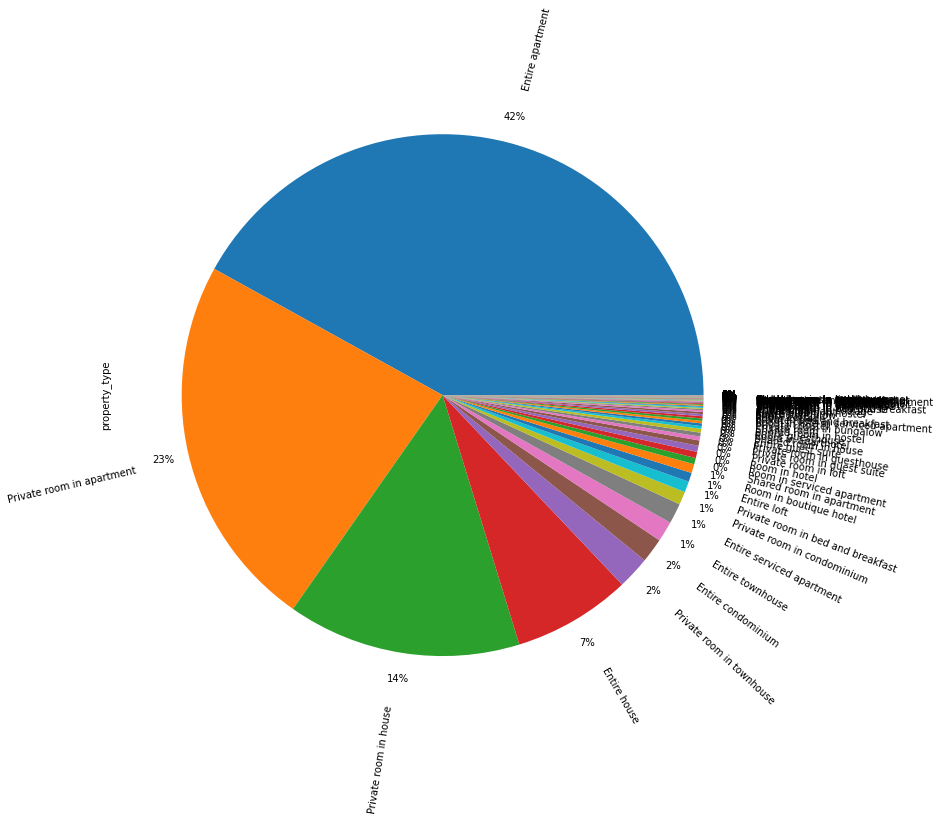

In [13]:
# calculate the percentage of each property type.
display(listings['property_type'].value_counts(normalize=True))

# Show property categories
plt.figure(figsize = (20, 12))
listings['property_type'].value_counts(normalize=True).plot.pie(autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2, rotatelabels=True)
plt.show()

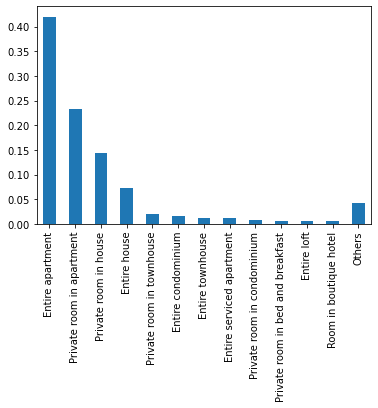

Property types: ['Entire apartment', 'Private room in apartment', 'Private room in house'] make up 79.75 % of the total property types


In [14]:
prob = listings['property_type'].value_counts(normalize=True)
# Setting a threshold. This threshold means that if the frequency of the property types that is less than this value, they will be categorised as 'Others'
threshold = 0.005
mask = prob > threshold
tail_prob = prob.loc[~mask].sum()
prob = prob.loc[mask]
prob['Others'] = tail_prob
prob.plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

print("Property types: {} make up {} % of the total property types".format(
    list(prob[:3].index), 
    round(prob[:3].sum(), 4) * 100
))

In [15]:
# Replace with Other if the frequency of the category is below set threshold (we set it at 0.005, refer to above) 
listings.loc[~listings['property_type'].isin(prob.index.drop('Others')), 'property_type'] = 'Others'
listings['property_type'].value_counts()

Entire apartment                     32299
Private room in apartment            17952
Private room in house                11136
Entire house                          5635
Others                                3283
Private room in townhouse             1552
Entire condominium                    1171
Entire townhouse                       976
Entire serviced apartment              966
Private room in condominium            622
Private room in bed and breakfast      524
Entire loft                            429
Room in boutique hotel                 428
Name: property_type, dtype: int64

# Bathrooms, bedrooms, beds

In [16]:
fill_median = lambda col: col.fillna(col.median())
listings[['bathrooms', 'bedrooms', 'beds']] = listings[['bathrooms', 'bedrooms', 'beds']].apply(fill_median)

listings[['bathrooms', 'bedrooms', 'beds']].isnull().sum()

bathrooms    0
bedrooms     0
beds         0
dtype: int64

# First_review and last_review

In [17]:
100 * listings[['first_review', 'last_review']].isnull().sum() / len(listings)

first_review    28.225482
last_review     28.225482
dtype: float64

In [18]:
listings[['first_review','last_review']].isnull().sum()

first_review    21726
last_review     21726
dtype: int64

In [19]:
# Convert to datetime object
listings['first_review'] = pd.to_datetime(listings['first_review'])
listings['last_review'] = pd.to_datetime(listings['last_review'])

# New feature to calculate number of days between review date and the date the dataset was scraped
listings['days_since_first_review'] = (listings['last_scraped'] - listings['first_review'])
listings['days_since_last_review'] = (listings['last_scraped'] - listings['last_review'])

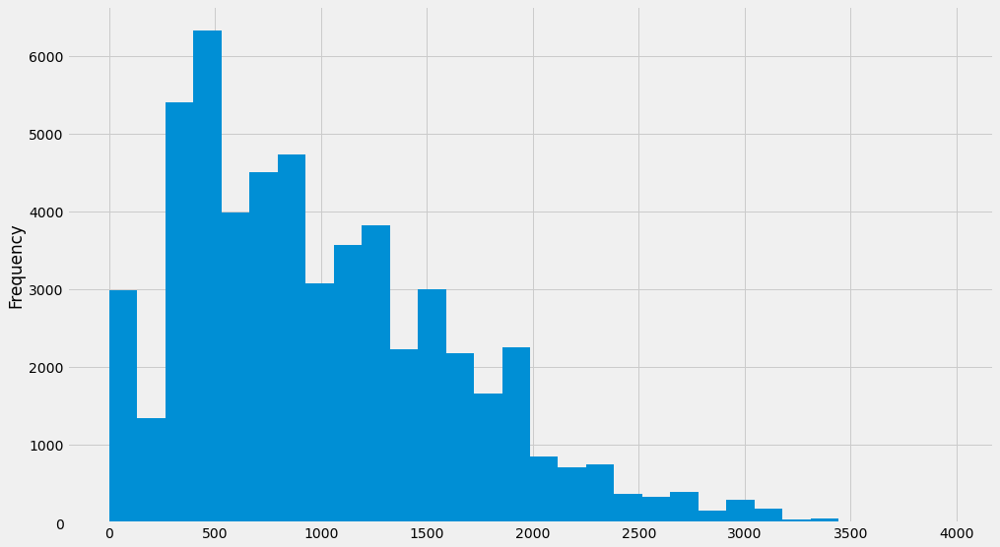

In [20]:
from datetime import datetime, timedelta

plt.style.use('fivethirtyeight')

listings['days_since_first_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));
def categorise_col(col_name, new_col, bins, labels):
    listings[new_col] = pd.cut(listings[col_name], bins, labels=labels)
    listings[new_col] = listings[new_col].astype('str')
    listings[new_col] = listings[new_col].str.replace('nan', 'No reviews')
    listings[new_col] = listings[new_col].astype('category')
    
bins = pd.to_timedelta([0, 182, 365, 730, 1460, max(listings['days_since_first_review'])], unit='days')
labels = ['0-6 months',
           '6-12 months',
           '1-2 years',
           '2-3 years',
           '4+ years']
categorise_col('days_since_first_review', 'days_since_first_review_cats', bins, labels)

21727

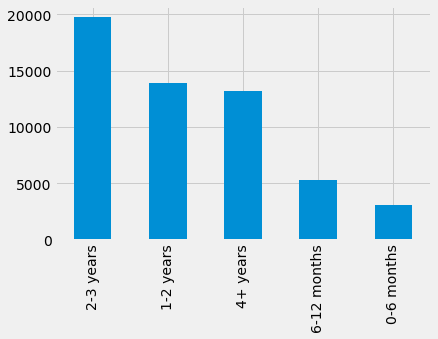

In [21]:
listings['days_since_first_review_cats'].value_counts().plot(kind='bar')
listings['days_since_first_review_cats'].isnull().sum()

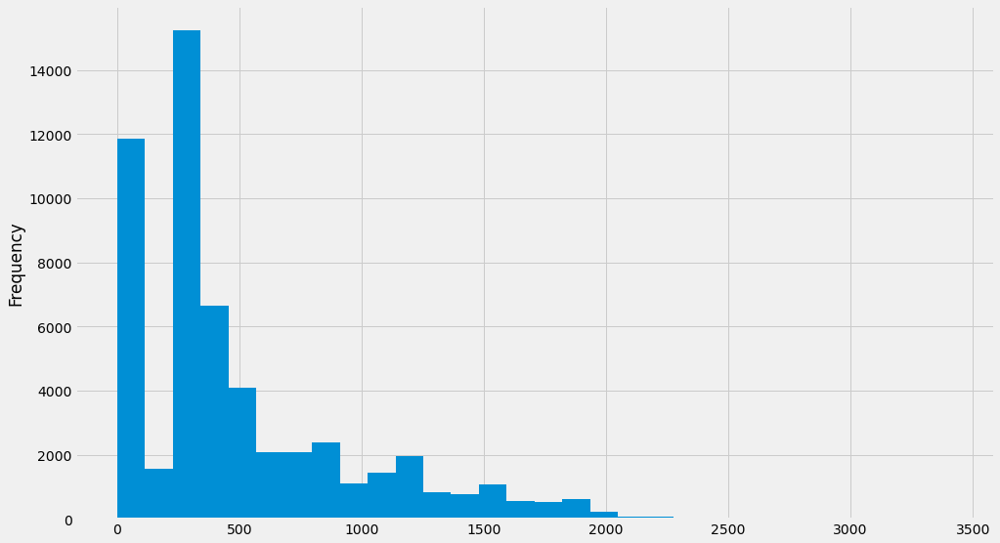

In [22]:
listings['days_since_last_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));

21731

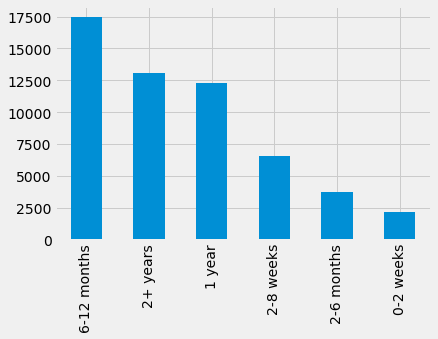

In [23]:
bins2 = pd.to_timedelta([0, 14, 60, 182, 365, 730, max(listings['days_since_last_review'])], unit='days')
labels2 = ['0-2 weeks', '2-8 weeks', '2-6 months', '6-12 months', '1 year', '2+ years']

categorise_col('days_since_last_review', 'days_since_last_review_cats', bins=bins2, labels=labels2)
listings['days_since_last_review_cats'].value_counts().plot(kind='bar');
listings['days_since_last_review_cats'].isnull().sum()

# # Storing the first_review column in a variable for Exploratory Data Analysis
# first_review = listings['first_review']
# review_scores_rating = listings['review_scores_rating']

# Review scores columns

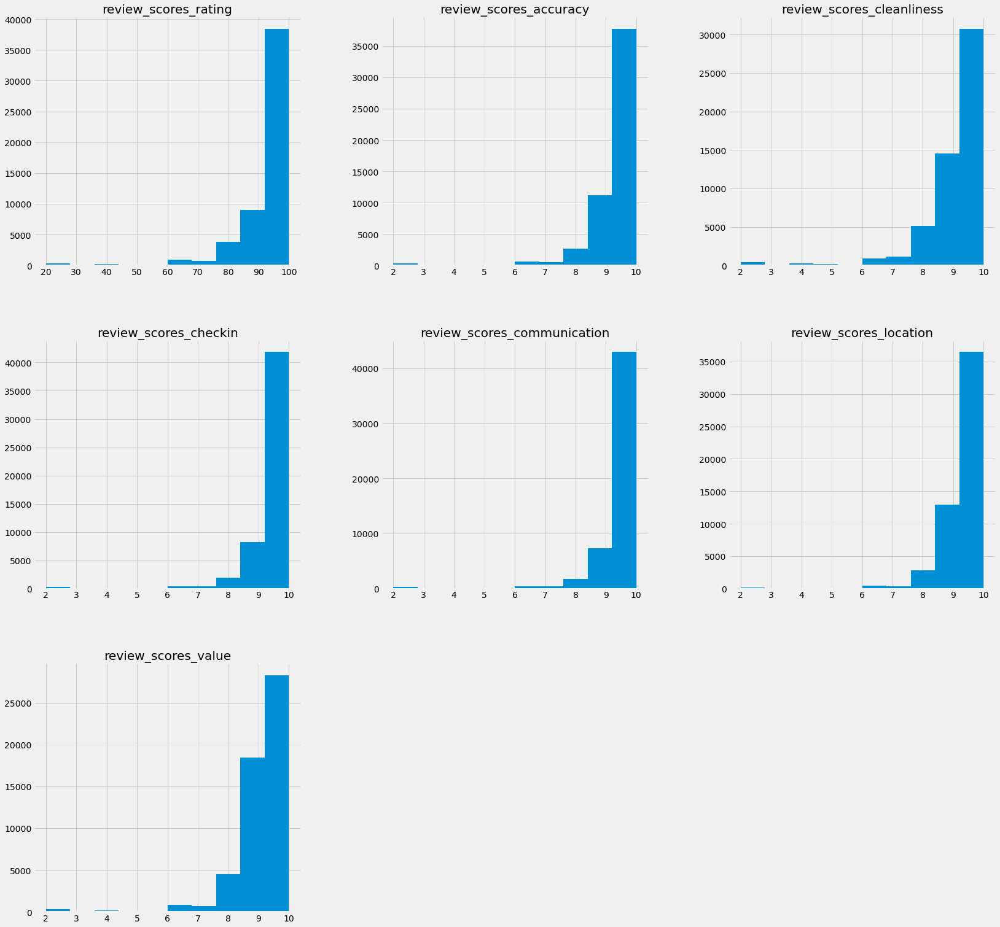

In [24]:
listings.isnull().sum().sort_values(ascending=False)
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings[review_cols].hist(figsize=(25, 25));

In [25]:
# Categorising columns out of 10
review_cols_10 = ['review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']
new_cols_10 = [s + "_cats" for s in review_cols_10]
bins3 = [0, 8, 9, 10]
labels3 = ['0-8/10', '9/10', '10/10']

for i, col in enumerate(review_cols_10):
    categorise_col(col, new_cols_10[i], bins=bins3, labels=labels3)

# Categorising column out of 10
categorise_col('review_scores_rating', 'review_scores_rating_cat', 
               bins=[0, 80, 95, 100], 
               labels=['0-79/100', '80-94/100', '95-100/100'])

# Handling Price Outliers

Mean price: £ 100.05314850661921
Median price: £ 74.0
Standard Deviation of Price: £ 94.79769234126594
Four times Standard Deviation: £ 379.1907693650638
Number of outliers:  922
Percentage greater than 4X standard deviation:  2.1786860327647357


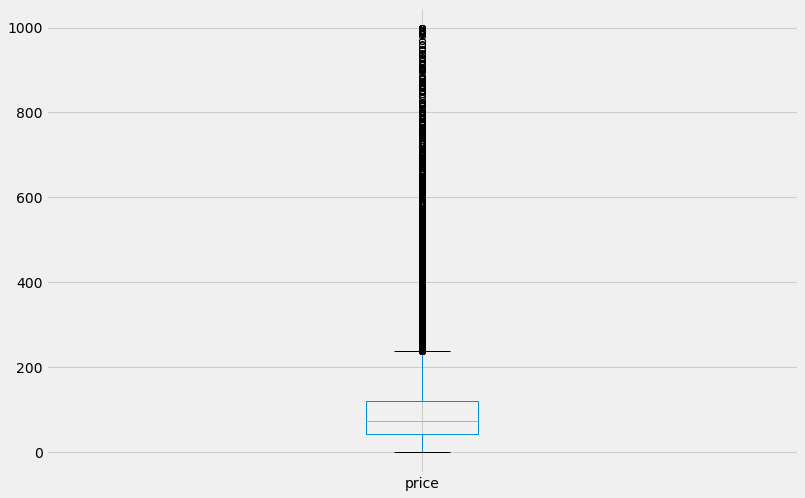

In [26]:
listings['price'].plot(kind='box', figsize=(12, 8));

meanPrice = listings['price'].mean()
medianPrice = listings['price'].median()
stdDevPrice = listings['price'].std()
print('Mean price: £', meanPrice)
print('Median price: £', medianPrice)
print('Standard Deviation of Price: £', stdDevPrice)
print('Four times Standard Deviation: £', 4 *stdDevPrice)

outliers = abs(listings['price'] - meanPrice) > 4 * stdDevPrice

print('Number of outliers: ', outliers.sum())

#6 *std = 568.7611414677139 plus mean = 668 ==> there's 306 above this price
#5 *std = 473.9676178897616 plus mean = 573 ==> there's 477 above this price
#4 *std = 379.17409431180926 plus mean = 479 ==> there's 922 above this price
#3.5 *std = 284.3805707338569 plus mean = 384 ==> there's 1641 above this price
print('Percentage greater than 4X standard deviation: ', 100 * (len(listings[listings['price'] > 379]) / len(listings)))

listings = listings[listings['price'] < 379]

Host response time

In [27]:
listings.host_response_time.isnull().sum()

37099

In [28]:
listings['host_response_time'] = listings['host_response_time'].fillna('not provided')

In [29]:
listings.host_response_time.isnull().sum()

0

In [30]:
df_not_num = listings.select_dtypes(include = ['O'])
print('There are {} non numerical features including:\n{}'.format(len(df_not_num.columns), df_not_num.columns.tolist()))
df_not_num.head(4)

There are 5 non numerical features including:
['host_response_time', 'neighbourhood_cleansed', 'property_type', 'room_type', 'amenities']


,host_response_time,neighbourhood_cleansed,property_type,room_type,amenities
0,within an hour,Lambeth,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ..."
1,within a day,Islington,Private room in apartment,Private room,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa..."
2,within a day,Kensington and Chelsea,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ..."
3,within an hour,Westminster,Entire apartment,Entire home/apt,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ..."


<ipython-input-31-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-31-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
<ipython-input-31-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-31-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
<ipython-input-31-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-31-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLoca

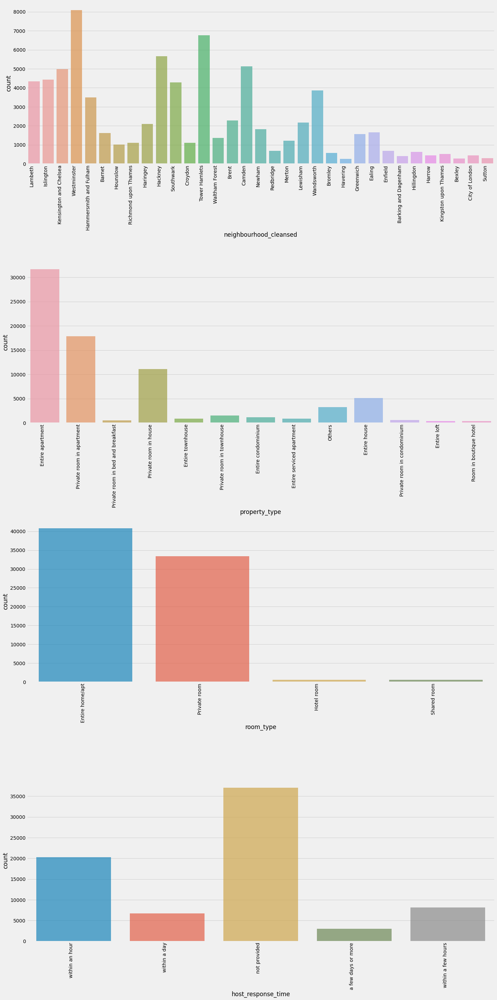

In [31]:
#We are excluding 'amentities' as it is a multi-value feature.

df_not_num = df_not_num[['neighbourhood_cleansed', 'property_type', 'room_type', 'host_response_time']]

#Let's see their distribution

ncols = 1

fig, axes = plt.subplots(round(len(df_not_num.columns) / ncols), ncols, figsize=(20, 40))
#plt.xticks(rotation=90)

for i, ax in enumerate(fig.axes):
    if i < len(df_not_num.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
        sns.countplot(x=df_not_num.columns[i], alpha=0.7, data=df_not_num, ax=ax)

fig.tight_layout()

# Amenities

In [32]:
import re
    
def one_hot_encode_amenities(df):
    '''
    INPUT: 
    df - Original dataframe
    OUTPUT: 
    df_amenities - One-hot encoded dataframe of amenities
        
    Create dummies from list of amenities
    
    '''
    def clean_amenities(row):
        '''
        Remove special characters and split the strings
        '''
        row = re.sub('[^A-Za-z,]+', '', row).split(",")
        return row
        
    df['amenities'] = df['amenities'].apply(clean_amenities)
    
    # Create columns from list of amenities
    df_amenities = df.amenities.str.join('|').str.get_dummies().add_prefix('amenity')
        
    # Include only those amenities that are found in >5% of the listings
    df_amenities = df_amenities[df_amenities.columns[df_amenities.sum() > 0.05 * len(df_amenities)]]
        
    return df_amenities

In [33]:
listings.amenities[5]

'["Coffee maker", "Heating", "Free street parking", "Wifi", "Kitchen", "Smoke alarm", "Washer", "Essentials", "Iron", "Lock on bedroom door", "Hair dryer", "Shampoo", "Hangers", "Laptop-friendly workspace"]'

In [34]:
amenities_df = one_hot_encode_amenities(listings)

In [35]:
listings.shape

(75287, 57)

In [36]:
# Remove amenities column
listings = listings.drop(['amenities'], axis=1)

#Concatenate dataframes
listings = pd.concat([listings, amenities_df], axis=1)
print(listings.shape)
listings.head()

(75287, 103)


,last_scraped,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,...,amenityDryer,amenityElevator,amenityEssentials,amenityExtrapillowsandblankets,amenityFireextinguisher,amenityFirstaidkit,amenityFreeparkingonpremises,amenityFreestreetparking,amenityGardenorbackyard,amenityHairdryer,amenityHangers,amenityHeating,amenityHostgreetsyou,amenityHotwater,amenityIndoorfireplace,amenityIron,amenityKitchen,amenityLaptopfriendlyworkspace,amenityLockbox,amenityLockonbedroomdoor,amenityLongtermstaysallowed,amenityLuggagedropoffallowed,amenityMicrowave,amenityOven,amenityPaidparkingoffpremises,amenityPatioorbalcony,amenityPrivateentrance,amenityPrivatelivingroom,amenityRefrigerator,amenityShampoo,amenityShowergel,amenitySinglelevelhome,amenitySmokealarm,amenityStove,amenityTV,amenityWasher,amenityWifi
0,2020-11-07,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,...,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,0,1,1,1,1,1
1,2020-11-07,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,...,1,0,1,1,1,0,0,1,0,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,1,1,0,0,1,1,0,0,1,1,1,1,1
2,2020-11-07,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,...,1,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,0,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,1
3,2020-11-06,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,...,1,1,1,0,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1
4,2020-11-07,not provided,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1


# Host_response_rate, host_acceptance_rate, reviews_per_month

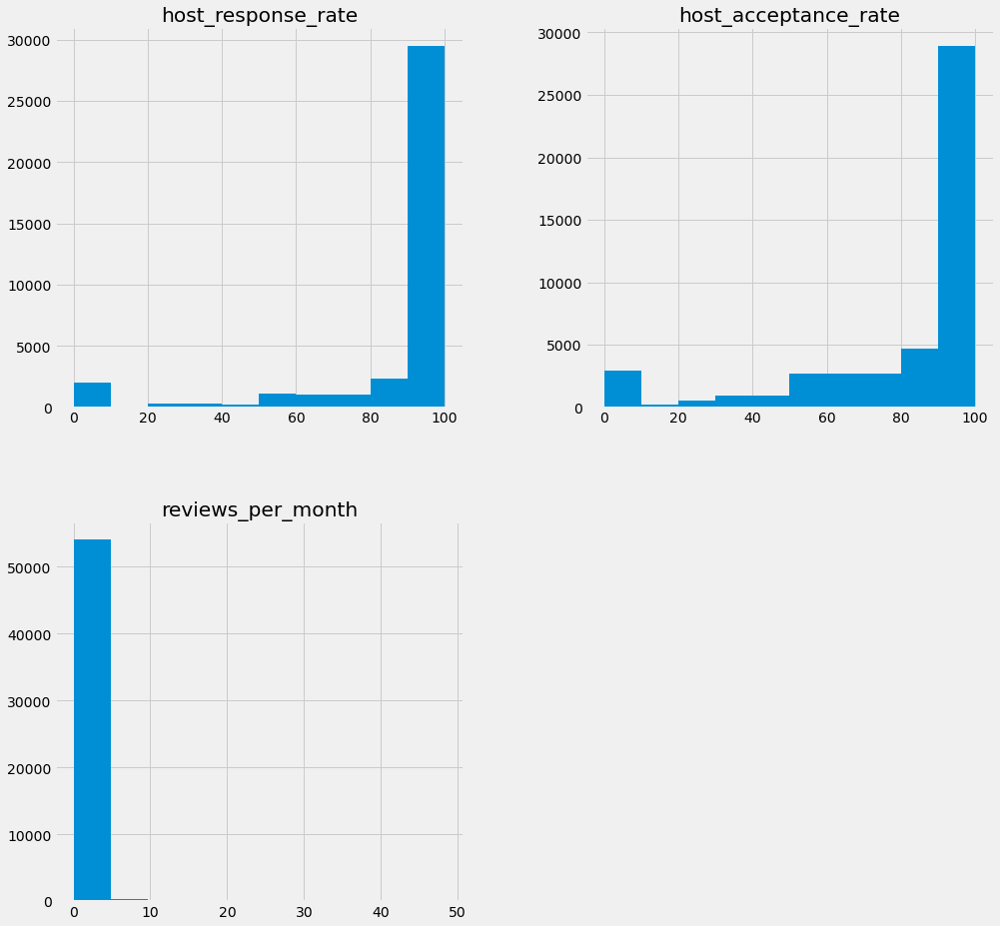

In [37]:
fill_mean = lambda col: col.fillna(col.mean())
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15));
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']] = listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].apply(fill_mean)

In [38]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].isnull().sum()

host_response_rate      0
host_acceptance_rate    0
reviews_per_month       0
dtype: int64

array([[<AxesSubplot:title={'center':'host_response_rate'}>,
        <AxesSubplot:title={'center':'host_acceptance_rate'}>],
       [<AxesSubplot:title={'center':'reviews_per_month'}>,
        <AxesSubplot:>]], dtype=object)

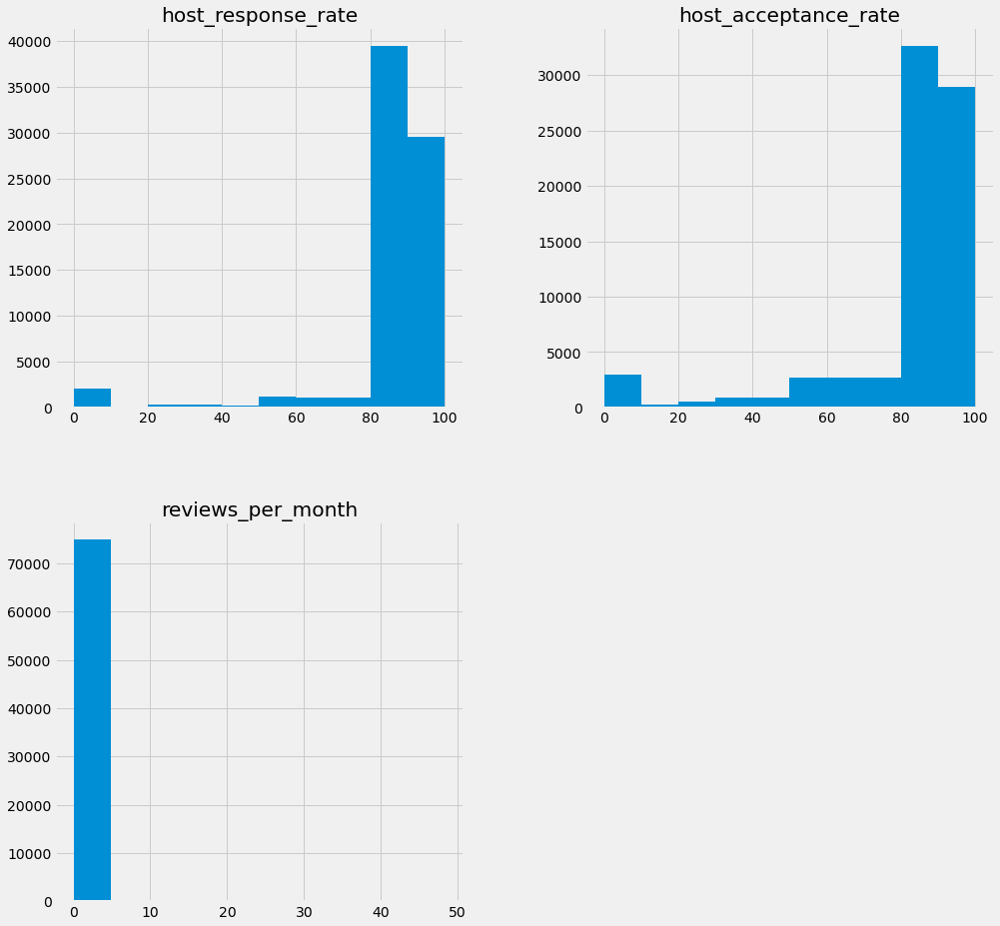

In [39]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15))

In [40]:
# Dropping initial and intermidiate columns
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings = listings.drop(review_cols, axis=1)
listings = listings.drop(columns=['last_review', 
                                  'days_since_last_review', 'days_since_first_review', 
                                  'first_review', 'last_scraped','host_listings_count'])

# Include all object and category columns
cat_columns = listings.select_dtypes(include=['object', 'category']).columns
for col in cat_columns:    
    listings = pd.concat([listings.drop(col, axis=1), pd.get_dummies(listings[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1) 
    
print(listings.shape)
listings.head()

(75287, 137)


,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,days_host_since,amenityAirconditioning,amenityBathtub,amenityBedlinens,amenityBreakfast,amenityCableTV,amenityCarbonmonoxidealarm,amenityCoffeemaker,...,neighbourhood_cleansed_Kingston upon Thames,neighbourhood_cleansed_Lambeth,neighbourhood_cleansed_Lewisham,neighbourhood_cleansed_Merton,neighbourhood_cleansed_Newham,neighbourhood_cleansed_Redbridge,neighbourhood_cleansed_Richmond upon Thames,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Sutton,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Entire condominium,property_type_Entire house,property_type_Entire loft,property_type_Entire serviced apartment,property_type_Entire townhouse,property_type_Others,property_type_Private room in apartment,property_type_Private room in bed and breakfast,property_type_Private room in condominium,property_type_Private room in house,property_type_Private room in townhouse,property_type_Room in boutique hotel,room_type_Hotel room,room_type_Private room,room_type_Shared room,days_since_first_review_cats_1-2 years,days_since_first_review_cats_2-3 years,days_since_first_review_cats_4+ years,days_since_first_review_cats_6-12 months,days_since_last_review_cats_1 year,days_since_last_review_cats_2+ years,days_since_last_review_cats_2-6 months,days_since_last_review_cats_2-8 weeks,days_since_last_review_cats_6-12 months
0,100.000000,100.000000,0.0,3.0,1.0,1.0,51.46225,-0.11732,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,1,2,2,0,0,1.4800,4053,0,0,0,0,1,1,1,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
1,83.000000,71.000000,0.0,3.0,1.0,1.0,51.56802,-0.11121,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,0,2,1,1,0,0.1700,4009,0,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
2,100.000000,100.000000,0.0,1.0,1.0,1.0,51.48796,-0.16898,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,1,1,1,0,0,0.6700,3990,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,67.000000,100.000000,1.0,18.0,1.0,1.0,51.52195,-0.14094,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,0,15,15,0,0,0.3600,3959,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
4,87.778831,81.330735,0.0,3.0,1.0,1.0,51.47935,-0.19743,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,0,2,0,2,0,0.6574,3959,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


# Correlation analysis - Consistent methods across used models

# Pearson correlation with Price

In [41]:
dfc = pd.DataFrame(listings.corr(method="pearson")["price"])
dfc.reset_index(inplace=True)
dfc.columns = ["features", "correlation_with_price"]
dfc.sort_values("correlation_with_price", ascending=False)
df1 = dfc[dfc["correlation_with_price"] > 0.1]
corr_features = df1["features"].values
corr_features.tolist().append("price")
print(df1.shape)
df1.sort_values(by=['correlation_with_price'], ascending=False)

(33, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.599245
10,bedrooms,0.542839
11,beds,0.483499
9,bathrooms,0.356858
114,property_type_Entire house,0.297117
74,amenityTV,0.292626
39,amenityDishwasher,0.254802
25,calculated_host_listings_count_entire_homes,0.242251
24,calculated_host_listings_count,0.228065


33


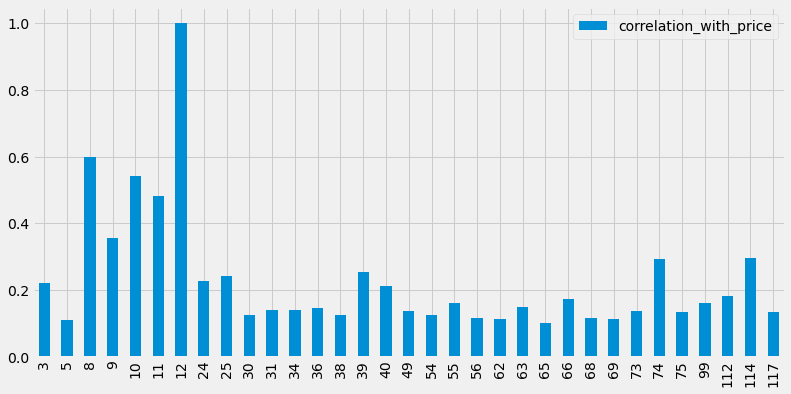

In [42]:
df1.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model to.
df1_col = ['host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
print(len(df1_col))

# Spearman correlation with price

In [43]:
dfs = pd.DataFrame(listings.corr(method="spearman")["price"])
dfs.reset_index(inplace=True)
dfs.columns = ["features", "correlation_with_price"]
dfs.sort_values("correlation_with_price", ascending=False)
df2 = dfs[dfs["correlation_with_price"] > 0.1]
corr_features = df2["features"].values
corr_features.tolist().append("price")
print(df2.shape)
df2.sort_values(by=['correlation_with_price'], ascending=False)

(38, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.650061
25,calculated_host_listings_count_entire_homes,0.605641
10,bedrooms,0.556734
11,beds,0.517831
74,amenityTV,0.342270
9,bathrooms,0.311029
114,property_type_Entire house,0.266364
39,amenityDishwasher,0.260979
40,amenityDryer,0.216050


38

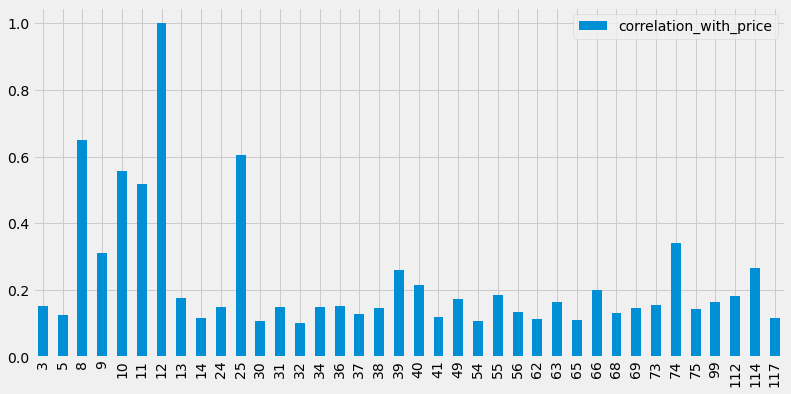

In [44]:
df2.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model on the features selected.
df2_col = ['amenity_Bed_linens_', 'maximum_nights', 'amenity_Elevator_', 'amenity_Cooking_basics_', 'minimum_nights','host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
len(df2_col)

# Principle Component Analysis

In [45]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

features = listings
# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

PCA(n_components=2)

In [46]:
# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.69436631e+13 7.15083079e+05]
[9.99999954e-01 4.22035685e-08]


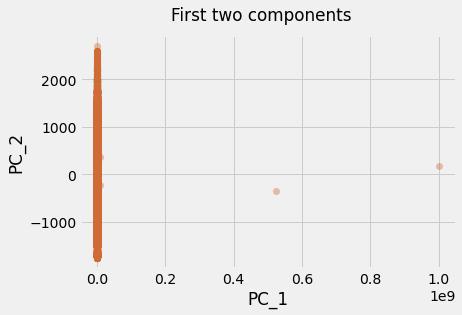

In [47]:
# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

In [48]:
loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

                                                            0             1
maximum_nights                                   1.000000e+00  9.418906e-07
days_host_since                                  9.458375e-07  9.998503e-01
availability_365                                 2.854046e-07  1.246307e-02
price                                            7.834988e-08  1.579331e-03
number_of_reviews                                6.095578e-08  6.854403e-03
availability_90                                  5.573521e-08  5.959634e-03
host_acceptance_rate                             3.646329e-08  3.406267e-03
availability_60                                  3.607265e-08  3.914837e-03
host_total_listings_count                        2.346563e-08  3.342821e-03
calculated_host_listings_count                   1.909357e-08  2.883911e-03
calculated_host_listings_count_entire_homes      1.805047e-08  2.503734e-03
availability_30                                  1.703599e-08  1.931638e-03
host_respons

In [49]:
listings.maximum_nights

0              190
1               29
2               50
3              365
4               21
5             1120
6               21
7               22
8              365
9               21
10              21
11             730
12              90
13              14
14            1125
15              25
16               7
17              10
18              31
19            1124
20            1125
21              50
22             730
23              14
24              14
25            1125
26              30
27              90
28              90
29             200
30               7
31              21
32              30
33            1095
34            1125
35             365
36              42
37              14
38             365
39             730
40             365
41             730
42            1125
43             730
44             730
45             730
46            1125
47             730
48              60
49              90
50              31
51               4
52          

(array([7.5285e+04, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([1.00000000e+00, 5.00000009e+07, 1.00000001e+08, 1.50000001e+08,
        2.00000001e+08, 2.50000000e+08, 3.00000000e+08, 3.50000000e+08,
        4.00000000e+08, 4.50000000e+08, 5.00000000e+08, 5.50000000e+08,
        6.00000000e+08, 6.50000000e+08, 7.00000000e+08, 7.50000000e+08,
        7.99999999e+08, 8.49999999e+08, 8.99999999e+08, 9.49999999e+08,
        9.99999999e+08]),
 <BarContainer object of 20 artists>)

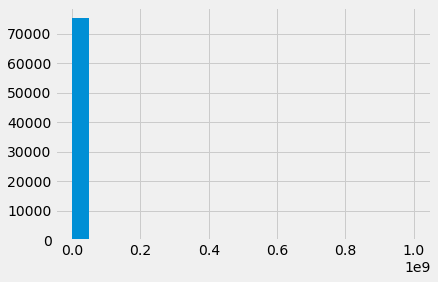

In [50]:
plt.hist(listings['maximum_nights'],bins=20)

(array([1595., 3774., 4478., 4596., 4052., 5464., 5182., 7651., 9419.,
        6646., 6868., 4326., 3672., 3500., 2376., 1103.,  378.,  135.,
          48.,   24.]),
 array([2.0000e+00, 2.2530e+02, 4.4860e+02, 6.7190e+02, 8.9520e+02,
        1.1185e+03, 1.3418e+03, 1.5651e+03, 1.7884e+03, 2.0117e+03,
        2.2350e+03, 2.4583e+03, 2.6816e+03, 2.9049e+03, 3.1282e+03,
        3.3515e+03, 3.5748e+03, 3.7981e+03, 4.0214e+03, 4.2447e+03,
        4.4680e+03]),
 <BarContainer object of 20 artists>)

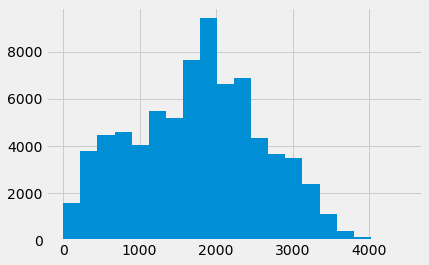

In [51]:
plt.hist(listings['days_host_since'],bins=20)

In [52]:
#Dropped Maximum nights, days_host_since, host_total_listings_count, availability_365, 
#calculated_host_listings_count, calculated_host_listings_count_entire_homes, price

[10.90701534  5.43544964]
[0.08019758 0.03996601]
                                                        0         1
amenityRefrigerator                              0.251932  0.020910
amenityDishesandsilverware                       0.245315  0.016524
amenityOven                                      0.244708  0.015454
amenityCookingbasics                             0.237315  0.026754
amenityStove                                     0.235429  0.008034
amenityMicrowave                                 0.226225  0.024102
amenityBedlinens                                 0.209054  0.030278
amenityHotwater                                  0.197262  0.071966
amenityDishwasher                                0.195563  0.071266
amenityCoffeemaker                               0.180255  0.017141
amenityLongtermstaysallowed                      0.167300  0.066813
amenityExtrapillowsandblankets                   0.150427  0.080009
amenityPatioorbalcony                            0.141714  0.00696

has_availability                                 0.000000  0.000000


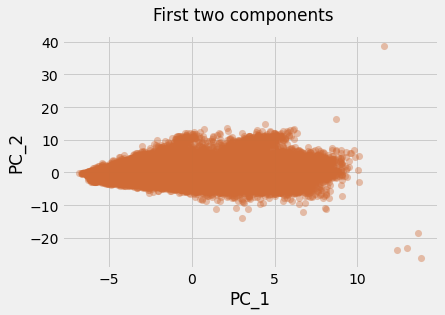

In [53]:
#going to repeat the above but scale the features
features = listings

features=preprocessing.scale(features)

# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

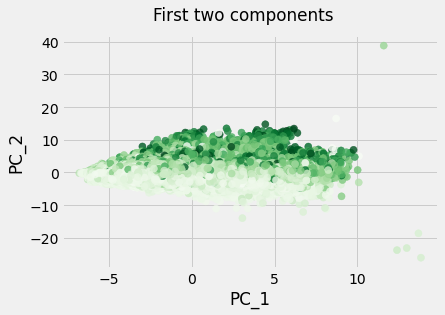

In [54]:
plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = listings['price'], cmap = plt.cm.Greens, s = 50, alpha = 0.8)

(75287, 136)
75287


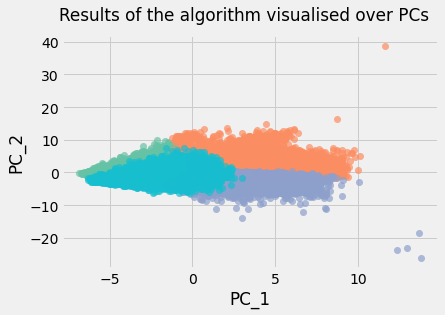

In [55]:
from sklearn.cluster import KMeans

features = listings.iloc[:,1:]
knownLabels=listings.iloc[:,0]

features=preprocessing.scale(features)

print(features.shape)
print(len(knownLabels))

#computing K-Means with K = 3 (3 clusters)
kmeansModel = KMeans(init='random', n_clusters=4, n_init=10)
kmeansModel.fit_predict(features)
clusterLabels = kmeansModel.labels_

pca = PCA(n_components=2)


# We first fit a PCA model to the data
pca.fit(features)

# have a look at the components directly if we can notice any interesting structure
projectedAxes = pca.transform(features)
projectedAxes=pd.DataFrame(projectedAxes) #put into a dataframe so easier to filter

plt.figure(1)
plt.suptitle('Results of the algorithm visualised over PCs')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
#draw 3 scatterplots on top of each other, using a different colour for each
plt.scatter(projectedAxes[clusterLabels==0][0], projectedAxes[clusterLabels==0][1], c = "#66c2a5", s = 50, alpha = 0.7, linewidth=0) # greenish
plt.scatter(projectedAxes[clusterLabels==1][0], projectedAxes[clusterLabels==1][1], c = "#fc8d62", s = 50, alpha = 0.7, linewidth=0) # orangish
plt.scatter(projectedAxes[clusterLabels==2][0], projectedAxes[clusterLabels==2][1], c = "#8da0cb", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.scatter(projectedAxes[clusterLabels==3][0], projectedAxes[clusterLabels==3][1], c = "#17becf", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==4][0], projectedAxes[clusterLabels==4][1], c = "#bcbd22", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==5][0], projectedAxes[clusterLabels==5][1], c = "#7f7f7f", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==6][0], projectedAxes[clusterLabels==6][1], c = "#e377c2", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.show()


#'#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'

In [56]:
for i, clustLabel in enumerate(clusterLabels):
    print("Cluster result: ", clustLabel, " Known labels: ",knownLabels[i])

Cluster result:  2  Known labels:  100.0
Cluster result:  2  Known labels:  83.0
Cluster result:  2  Known labels:  100.0
Cluster result:  1  Known labels:  67.0
Cluster result:  3  Known labels:  87.778831046402
Cluster result:  0  Known labels:  87.778831046402
Cluster result:  3  Known labels:  100.0
Cluster result:  1  Known labels:  100.0
Cluster result:  2  Known labels:  100.0
Cluster result:  3  Known labels:  0.0
Cluster result:  3  Known labels:  87.778831046402
Cluster result:  3  Known labels:  87.778831046402
Cluster result:  1  Known labels:  0.0
Cluster result:  2  Known labels:  100.0
Cluster result:  1  Known labels:  100.0
Cluster result:  3  Known labels:  87.778831046402
Cluster result:  2  Known labels:  100.0
Cluster result:  2  Known labels:  87.778831046402
Cluster result:  2  Known labels:  87.778831046402
Cluster result:  0  Known labels:  87.778831046402
Cluster result:  1  Known labels:  100.0
Cluster result:  2  Known labels:  100.0
Cluster result:  0  Know

KeyError: 63

# Using Panda's corr() method calculates the relationship between each feature in relation to price

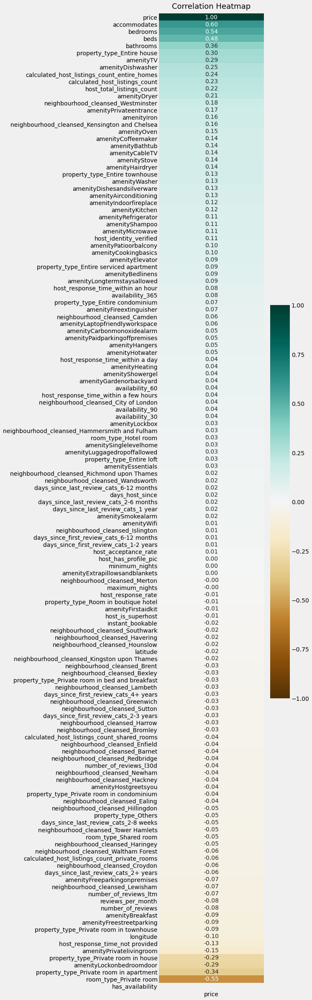

In [57]:
plt.figure(figsize=(5, 40))
feature_correlation = listings.corr()[['price']].sort_values(by='price', ascending=False)

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

Text(0.5, 1.0, 'Correlation Heatmap')

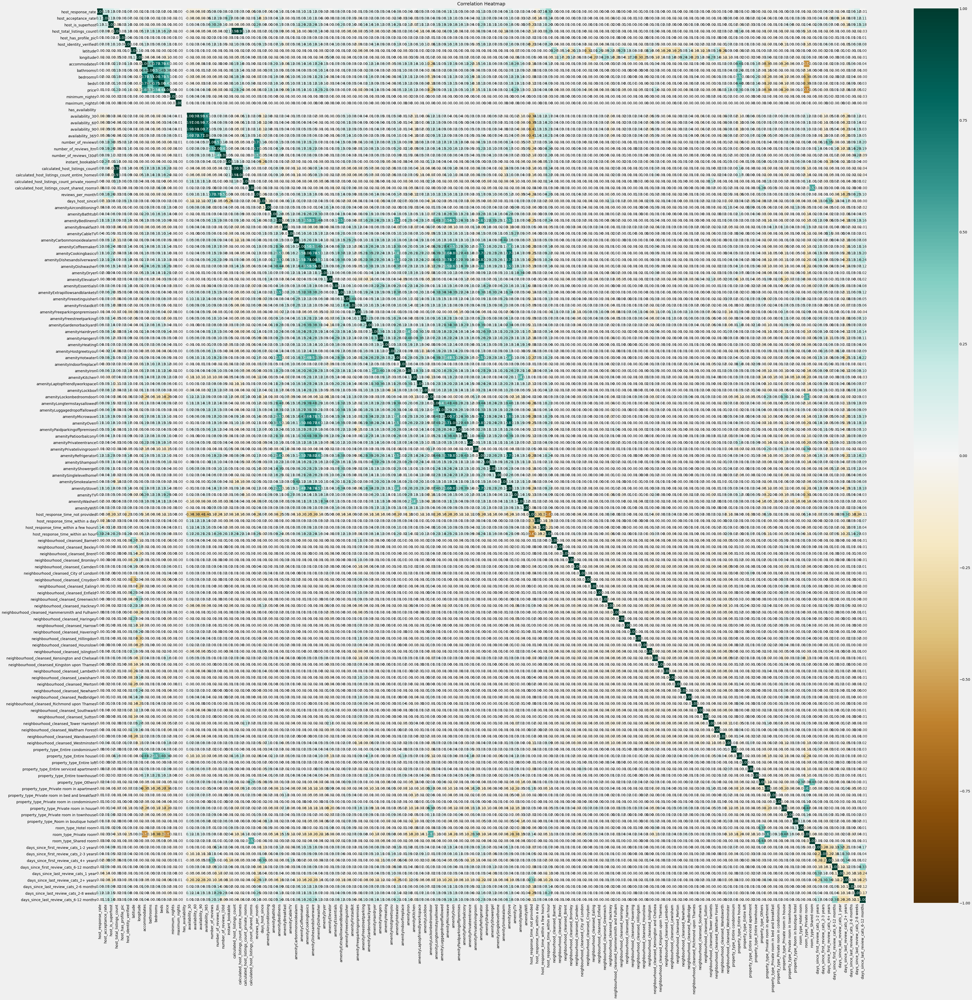

In [58]:
plt.figure(figsize=(60, 60))
feature_correlation = listings.corr()

mask = (feature_correlation > 0.15) & (feature_correlation < 0.95) & (feature_correlation != 1)

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

In [59]:
feature_correlation_price = abs(feature_correlation['price'])
mask = (feature_correlation_price > 0.10) & (feature_correlation_price < 0.95) & (feature_correlation_price != 1)

# Columns to keep
columns_to_keep = list(feature_correlation_price[mask].index)

# Changed to include price for NN
columns_to_keep.append('price')

print(len(columns_to_keep))

columns_to_keep

40


['host_total_listings_count',
 'host_identity_verified',
 'longitude',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'amenityAirconditioning',
 'amenityBathtub',
 'amenityCableTV',
 'amenityCoffeemaker',
 'amenityDishesandsilverware',
 'amenityDishwasher',
 'amenityDryer',
 'amenityHairdryer',
 'amenityIndoorfireplace',
 'amenityIron',
 'amenityKitchen',
 'amenityLockonbedroomdoor',
 'amenityMicrowave',
 'amenityOven',
 'amenityPatioorbalcony',
 'amenityPrivateentrance',
 'amenityPrivatelivingroom',
 'amenityRefrigerator',
 'amenityShampoo',
 'amenityStove',
 'amenityTV',
 'amenityWasher',
 'host_response_time_not provided',
 'neighbourhood_cleansed_Kensington and Chelsea',
 'neighbourhood_cleansed_Westminster',
 'property_type_Entire house',
 'property_type_Entire townhouse',
 'property_type_Private room in apartment',
 'property_type_Private room in house',
 'room_type_Private room',
 'price']

# Variance Inflation Factors (VIFs)

In [60]:
from sklearn.preprocessing import MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

final_listings = listings[columns_to_keep]
final_listings = final_listings.drop('longitude', axis=1)

# Improve performance of ML algorithm due to smaller values. ML algorithms see larger numbers as more impactful.
final_listings_scaled = MinMaxScaler().fit_transform(final_listings)
final_listings_scaled_df = pd.DataFrame(final_listings_scaled, columns=final_listings.columns)
final_listings_scaled_df.head()

# Visualize cleaned dataset
final_listings_corr = final_listings_scaled_df.corr()

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(final_listings_corr.values, i) for i in range(final_listings_corr.shape[1])]
vif["features"] = final_listings_corr.columns
vif = vif.round(1)

pd.set_option('max_rows', None)
display(vif.sort_values('VIF', ascending=False))

,VIF,features
6,10525.1,calculated_host_listings_count
7,6304.4,calculated_host_listings_count_entire_homes
0,2739.0,host_total_listings_count
37,245.8,room_type_Private room
25,215.6,amenityRefrigerator
21,195.1,amenityOven
2,92.2,accommodates
35,88.8,property_type_Private room in apartment
27,86.2,amenityStove
12,76.4,amenityDishesandsilverware


In [74]:
final_listings_scaled_df.shape

(75287, 39)

In [75]:
listings = final_listings_scaled_df
print (listings.head())

   host_total_listings_count  host_identity_verified  accommodates  bathrooms  \
0                   0.002013                     1.0      0.200000   0.028571   
1                   0.002013                     1.0      0.066667   0.028571   
2                   0.000671                     1.0      0.066667   0.028571   
3                   0.012081                     1.0      0.333333   0.057143   
4                   0.002013                     1.0      0.066667   0.028571   

   bedrooms  beds  calculated_host_listings_count  \
0  0.000000  0.06                        0.001140   
1  0.000000  0.00                        0.001140   
2  0.000000  0.02                        0.000000   
3  0.040816  0.06                        0.015964   
4  0.000000  0.02                        0.001140   

   calculated_host_listings_count_entire_homes  amenityAirconditioning  \
0                                     0.002281                     0.0   
1                                     0.001140

In [76]:
# Columns and their empty values:
print (listings.isnull().sum())

host_total_listings_count                        0
host_identity_verified                           0
accommodates                                     0
bathrooms                                        0
bedrooms                                         0
beds                                             0
calculated_host_listings_count                   0
calculated_host_listings_count_entire_homes      0
amenityAirconditioning                           0
amenityBathtub                                   0
amenityCableTV                                   0
amenityCoffeemaker                               0
amenityDishesandsilverware                       0
amenityDishwasher                                0
amenityDryer                                     0
amenityHairdryer                                 0
amenityIndoorfireplace                           0
amenityIron                                      0
amenityKitchen                                   0
amenityLockonbedroomdoor       

# Modeling: Multi-Layer Perceptron

Using a Keras sequential model, I will implement a baseline neural network, plot loss, and calculate the Training RMSE, Test RMSE, Training R2, Test R2, Training Mean Absolute Error, and Test Mean Absolute Error.  I will then repeat this for different configurations and parameters (Neural network 2, 3, 4, ...).

In [91]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

Splitting data

In [92]:
X = listings.drop('price', axis=1)
y = listings['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

In [93]:
tf.keras.backend.set_floatx('float32')

# Neural network 1 (Baseline)

Basic keras sequential model using 2 hidden layers, sigmoid activation function, adam optimiser and 20 epochs

In [94]:
model = tf.keras.Sequential([
    Dense(128, activation='sigmoid'), # Hidden layer
    Dense(64, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=20, batch_size=64)

Epoch 1/20
942/942 - 36s - loss: 0.0173 - mae: 0.0912 - root_mean_squared_error: 0.1316 - val_loss: 0.0157 - val_mae: 0.0817 - val_root_mean_squared_error: 0.1255 - 36s/epoch - 38ms/step
Epoch 2/20
942/942 - 3s - loss: 0.0158 - mae: 0.0860 - root_mean_squared_error: 0.1255 - val_loss: 0.0223 - val_mae: 0.1259 - val_root_mean_squared_error: 0.1494 - 3s/epoch - 3ms/step
Epoch 3/20
942/942 - 3s - loss: 0.0156 - mae: 0.0855 - root_mean_squared_error: 0.1250 - val_loss: 0.0147 - val_mae: 0.0812 - val_root_mean_squared_error: 0.1214 - 3s/epoch - 3ms/step
Epoch 4/20
942/942 - 3s - loss: 0.0153 - mae: 0.0841 - root_mean_squared_error: 0.1239 - val_loss: 0.0148 - val_mae: 0.0792 - val_root_mean_squared_error: 0.1217 - 3s/epoch - 3ms/step
Epoch 5/20
942/942 - 3s - loss: 0.0154 - mae: 0.0846 - root_mean_squared_error: 0.1241 - val_loss: 0.0161 - val_mae: 0.0821 - val_root_mean_squared_error: 0.1267 - 3s/epoch - 3ms/step
Epoch 6/20
942/942 - 3s - loss: 0.0152 - mae: 0.0836 - root_mean_squared_erro

Plotting loss

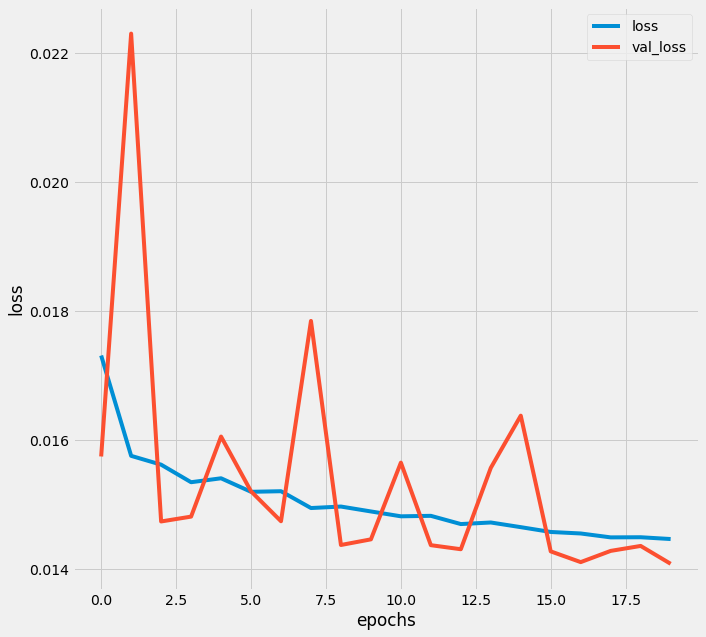

In [95]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [96]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.11936482966343366
        Test RMSE: 0.11866985128044982
        
        Training R2: 0.536531396855743
        Test R2: 0.5472214240922961
        
        Training Mean Absolute Error: 0.07800659323375998
        Test Mean Absolute Error: 0.07747683429088019
    


# Neural network 2

Same as before, but increasing number of epochs to see if it improves result.  Using 50.

In [97]:
model = tf.keras.Sequential([
    Dense(128, activation='sigmoid'), # Hidden layer
    Dense(64, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)

Epoch 1/50
942/942 - 40s - loss: 0.0268 - mae: 0.1037 - root_mean_squared_error: 0.1637 - val_loss: 0.0162 - val_mae: 0.0911 - val_root_mean_squared_error: 0.1271 - 40s/epoch - 42ms/step
Epoch 2/50
942/942 - 3s - loss: 0.0157 - mae: 0.0855 - root_mean_squared_error: 0.1254 - val_loss: 0.0150 - val_mae: 0.0843 - val_root_mean_squared_error: 0.1225 - 3s/epoch - 3ms/step
Epoch 3/50
942/942 - 3s - loss: 0.0155 - mae: 0.0853 - root_mean_squared_error: 0.1247 - val_loss: 0.0148 - val_mae: 0.0822 - val_root_mean_squared_error: 0.1215 - 3s/epoch - 3ms/step
Epoch 4/50
942/942 - 3s - loss: 0.0154 - mae: 0.0847 - root_mean_squared_error: 0.1243 - val_loss: 0.0152 - val_mae: 0.0801 - val_root_mean_squared_error: 0.1233 - 3s/epoch - 3ms/step
Epoch 5/50
942/942 - 3s - loss: 0.0154 - mae: 0.0845 - root_mean_squared_error: 0.1241 - val_loss: 0.0147 - val_mae: 0.0809 - val_root_mean_squared_error: 0.1210 - 3s/epoch - 3ms/step
Epoch 6/50
942/942 - 3s - loss: 0.0153 - mae: 0.0844 - root_mean_squared_erro

Epoch 46/50
942/942 - 3s - loss: 0.0137 - mae: 0.0784 - root_mean_squared_error: 0.1171 - val_loss: 0.0139 - val_mae: 0.0813 - val_root_mean_squared_error: 0.1178 - 3s/epoch - 3ms/step
Epoch 47/50
942/942 - 3s - loss: 0.0137 - mae: 0.0783 - root_mean_squared_error: 0.1170 - val_loss: 0.0135 - val_mae: 0.0768 - val_root_mean_squared_error: 0.1160 - 3s/epoch - 3ms/step
Epoch 48/50
942/942 - 4s - loss: 0.0137 - mae: 0.0782 - root_mean_squared_error: 0.1170 - val_loss: 0.0135 - val_mae: 0.0782 - val_root_mean_squared_error: 0.1161 - 4s/epoch - 4ms/step
Epoch 49/50
942/942 - 3s - loss: 0.0137 - mae: 0.0785 - root_mean_squared_error: 0.1172 - val_loss: 0.0138 - val_mae: 0.0817 - val_root_mean_squared_error: 0.1177 - 3s/epoch - 3ms/step
Epoch 50/50
942/942 - 3s - loss: 0.0136 - mae: 0.0782 - root_mean_squared_error: 0.1168 - val_loss: 0.0140 - val_mae: 0.0758 - val_root_mean_squared_error: 0.1181 - 3s/epoch - 3ms/step


Plotting loss

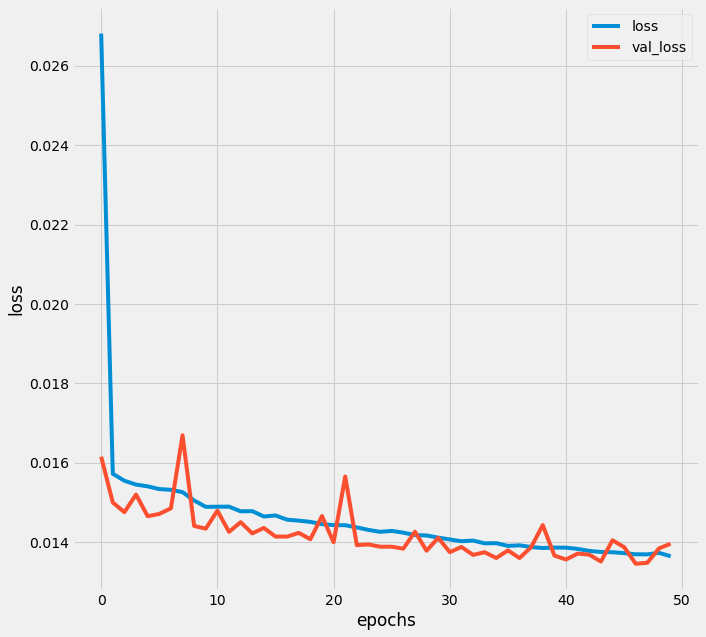

In [98]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [99]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.11850375846196527
        Test RMSE: 0.11814826653535873
        
        Training R2: 0.5431939964344659
        Test R2: 0.5511928355011573
        
        Training Mean Absolute Error: 0.07615511424184668
        Test Mean Absolute Error: 0.07583492945991098
    


# Neural network 3

Increasing number of units in the two hidden layers: 1024, 128

In [100]:
model = tf.keras.Sequential([
    Dense(1024, activation='sigmoid'), # Hidden layer
    Dense(128, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)

Epoch 1/50
942/942 - 42s - loss: 0.0286 - mae: 0.1061 - root_mean_squared_error: 0.1691 - val_loss: 0.0177 - val_mae: 0.0874 - val_root_mean_squared_error: 0.1332 - 42s/epoch - 44ms/step
Epoch 2/50
942/942 - 5s - loss: 0.0167 - mae: 0.0901 - root_mean_squared_error: 0.1291 - val_loss: 0.0161 - val_mae: 0.0814 - val_root_mean_squared_error: 0.1269 - 5s/epoch - 5ms/step
Epoch 3/50
942/942 - 5s - loss: 0.0159 - mae: 0.0864 - root_mean_squared_error: 0.1260 - val_loss: 0.0148 - val_mae: 0.0798 - val_root_mean_squared_error: 0.1217 - 5s/epoch - 5ms/step
Epoch 4/50
942/942 - 5s - loss: 0.0155 - mae: 0.0844 - root_mean_squared_error: 0.1244 - val_loss: 0.0166 - val_mae: 0.0834 - val_root_mean_squared_error: 0.1288 - 5s/epoch - 5ms/step
Epoch 5/50
942/942 - 5s - loss: 0.0154 - mae: 0.0841 - root_mean_squared_error: 0.1243 - val_loss: 0.0145 - val_mae: 0.0789 - val_root_mean_squared_error: 0.1205 - 5s/epoch - 5ms/step
Epoch 6/50
942/942 - 5s - loss: 0.0150 - mae: 0.0825 - root_mean_squared_erro

Epoch 46/50
942/942 - 5s - loss: 0.0138 - mae: 0.0790 - root_mean_squared_error: 0.1177 - val_loss: 0.0136 - val_mae: 0.0797 - val_root_mean_squared_error: 0.1165 - 5s/epoch - 5ms/step
Epoch 47/50
942/942 - 5s - loss: 0.0139 - mae: 0.0793 - root_mean_squared_error: 0.1179 - val_loss: 0.0135 - val_mae: 0.0781 - val_root_mean_squared_error: 0.1163 - 5s/epoch - 5ms/step
Epoch 48/50
942/942 - 5s - loss: 0.0138 - mae: 0.0792 - root_mean_squared_error: 0.1177 - val_loss: 0.0150 - val_mae: 0.0789 - val_root_mean_squared_error: 0.1225 - 5s/epoch - 5ms/step
Epoch 49/50
942/942 - 5s - loss: 0.0139 - mae: 0.0791 - root_mean_squared_error: 0.1177 - val_loss: 0.0158 - val_mae: 0.0945 - val_root_mean_squared_error: 0.1256 - 5s/epoch - 5ms/step
Epoch 50/50
942/942 - 5s - loss: 0.0138 - mae: 0.0787 - root_mean_squared_error: 0.1173 - val_loss: 0.0142 - val_mae: 0.0760 - val_root_mean_squared_error: 0.1191 - 5s/epoch - 5ms/step


Plotting loss

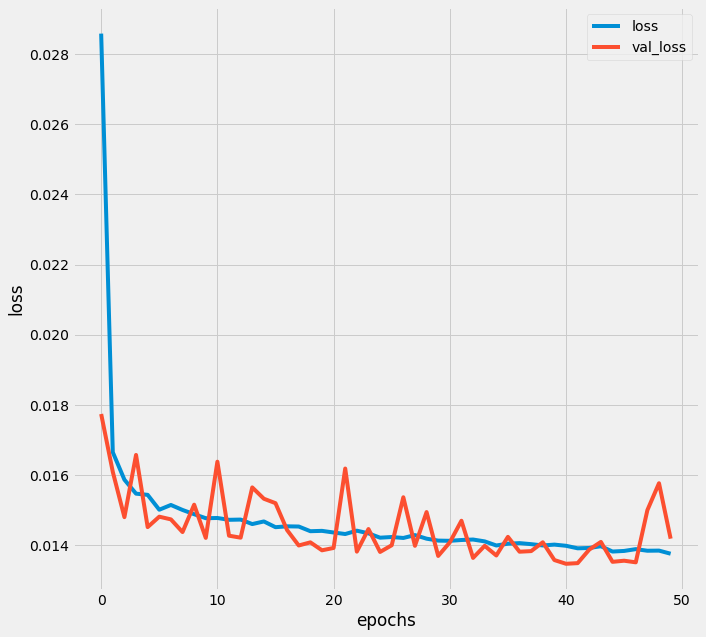

In [101]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [102]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.11926336189291904
        Test RMSE: 0.11912800577346506
        
        Training R2: 0.5373190180999345
        Test R2: 0.5437185465134794
        
        Training Mean Absolute Error: 0.07624880853857285
        Test Mean Absolute Error: 0.07601860697309107
    


# Neural network 4

Experimenting with a different activation function: Using relu (rectified linear unit) instead of sigmoid.

In [103]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)


Epoch 1/50
942/942 - 39s - loss: 0.0162 - mae: 0.0857 - root_mean_squared_error: 0.1272 - val_loss: 0.0145 - val_mae: 0.0797 - val_root_mean_squared_error: 0.1202 - 39s/epoch - 42ms/step
Epoch 2/50
942/942 - 5s - loss: 0.0147 - mae: 0.0812 - root_mean_squared_error: 0.1212 - val_loss: 0.0142 - val_mae: 0.0796 - val_root_mean_squared_error: 0.1192 - 5s/epoch - 5ms/step
Epoch 3/50
942/942 - 5s - loss: 0.0143 - mae: 0.0801 - root_mean_squared_error: 0.1198 - val_loss: 0.0145 - val_mae: 0.0828 - val_root_mean_squared_error: 0.1206 - 5s/epoch - 5ms/step
Epoch 4/50
942/942 - 5s - loss: 0.0141 - mae: 0.0794 - root_mean_squared_error: 0.1186 - val_loss: 0.0137 - val_mae: 0.0770 - val_root_mean_squared_error: 0.1169 - 5s/epoch - 5ms/step
Epoch 5/50
942/942 - 5s - loss: 0.0137 - mae: 0.0786 - root_mean_squared_error: 0.1173 - val_loss: 0.0138 - val_mae: 0.0813 - val_root_mean_squared_error: 0.1175 - 5s/epoch - 5ms/step
Epoch 6/50
942/942 - 5s - loss: 0.0136 - mae: 0.0782 - root_mean_squared_erro

Epoch 46/50
942/942 - 5s - loss: 0.0091 - mae: 0.0639 - root_mean_squared_error: 0.0954 - val_loss: 0.0148 - val_mae: 0.0784 - val_root_mean_squared_error: 0.1218 - 5s/epoch - 6ms/step
Epoch 47/50
942/942 - 5s - loss: 0.0090 - mae: 0.0634 - root_mean_squared_error: 0.0947 - val_loss: 0.0148 - val_mae: 0.0791 - val_root_mean_squared_error: 0.1218 - 5s/epoch - 5ms/step
Epoch 48/50
942/942 - 5s - loss: 0.0089 - mae: 0.0631 - root_mean_squared_error: 0.0943 - val_loss: 0.0148 - val_mae: 0.0796 - val_root_mean_squared_error: 0.1217 - 5s/epoch - 5ms/step
Epoch 49/50
942/942 - 5s - loss: 0.0090 - mae: 0.0633 - root_mean_squared_error: 0.0948 - val_loss: 0.0148 - val_mae: 0.0784 - val_root_mean_squared_error: 0.1218 - 5s/epoch - 5ms/step
Epoch 50/50
942/942 - 5s - loss: 0.0088 - mae: 0.0627 - root_mean_squared_error: 0.0938 - val_loss: 0.0150 - val_mae: 0.0792 - val_root_mean_squared_error: 0.1226 - 5s/epoch - 6ms/step


Plotting loss

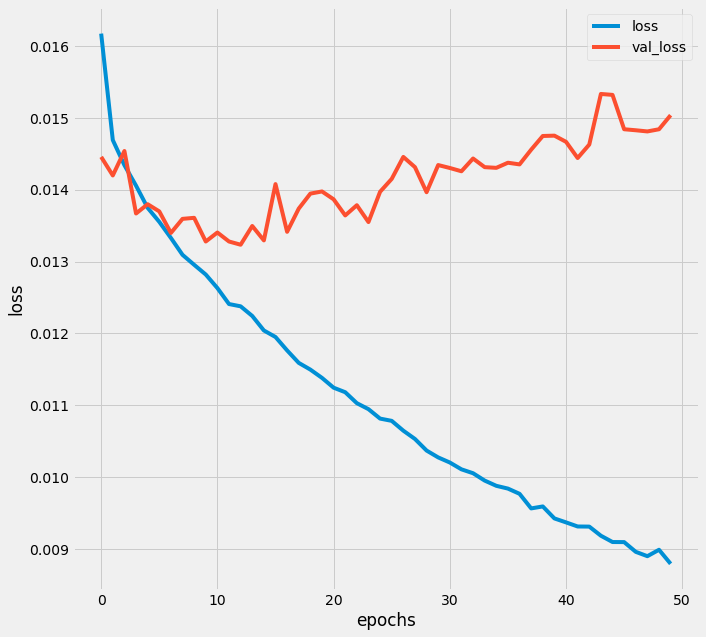

In [104]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [105]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.09203695193801464
        Test RMSE: 0.12263524289220584
        
        Training R2: 0.7244553339629387
        Test R2: 0.5164563725575686
        
        Training Mean Absolute Error: 0.06109518411583362
        Test Mean Absolute Error: 0.07924121683932675
    


# Neural network 5

Adding early stopping to avoid overfitting

In [106]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 42s 44ms/step - loss: 0.0161 - mae: 0.0853 - root_mean_squared_error: 0.1268 - val_loss: 0.0147 - val_mae: 0.0829 - val_root_mean_squared_error: 0.1213 - lr: 0.0010
Epoch 2/50
942/942 [==============================] - 6s 7ms/step - loss: 0.0147 - mae: 0.0812 - root_mean_squared_error: 0.1212 - val_loss: 0.0151 - val_mae: 0.0857 - val_root_mean_squared_error: 0.1230 - lr: 0.0010
Epoch 3/50
942/942 [==============================] - 6s 6ms/step - loss: 0.0143 - mae: 0.0802 - root_mean_squared_error: 0.1198 - val_loss: 0.0141 - val_mae: 0.0775 - val_root_mean_squared_error: 0.1186 - lr: 0.0010
Epoch 4/50
942/942 [==============================] - 6s 7ms/step - loss: 0.0141 - mae: 0.0795 - root_mean_squared_error: 0.1189 - val_loss: 0.0137 - val_mae: 0.0783 - val_root_mean_squared_error: 0.1169 - lr: 0.0010
Epoch 5/50
942/942 [==============================] - 6s 6ms/step - loss: 0.0138 - mae: 0.0787 - root_mean_squared_error: 0.1176 -

Plotting loss

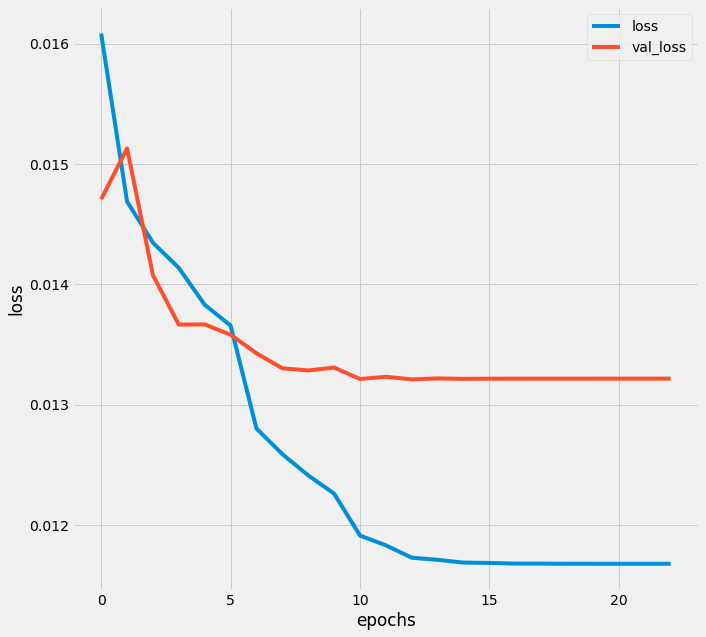

In [107]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [108]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.10806112987916514
        Test RMSE: 0.11496268422094409
        
        Training R2: 0.6201548705368657
        Test R2: 0.5750685611716002
        
        Training Mean Absolute Error: 0.07232965307814636
        Test Mean Absolute Error: 0.07599113494559971
    


# Neural network 6

Adding dropout layer for further optimisation

In [109]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dropout(0.3), # Dropout layer
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 45s 46ms/step - loss: 0.0178 - mae: 0.0894 - root_mean_squared_error: 0.1333 - val_loss: 0.0165 - val_mae: 0.0822 - val_root_mean_squared_error: 0.1286 - lr: 0.0010
Epoch 2/50
942/942 [==============================] - 7s 8ms/step - loss: 0.0159 - mae: 0.0844 - root_mean_squared_error: 0.1261 - val_loss: 0.0143 - val_mae: 0.0801 - val_root_mean_squared_error: 0.1196 - lr: 0.0010
Epoch 3/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0150 - mae: 0.0823 - root_mean_squared_error: 0.1223 - val_loss: 0.0142 - val_mae: 0.0809 - val_root_mean_squared_error: 0.1191 - lr: 0.0010
Epoch 4/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0147 - mae: 0.0817 - root_mean_squared_error: 0.1213 - val_loss: 0.0140 - val_mae: 0.0812 - val_root_mean_squared_error: 0.1184 - lr: 0.0010
Epoch 5/50
942/942 [==============================] - 7s 8ms/step - loss: 0.0145 - mae: 0.0813 - root_mean_squared_error: 0.1203 -

Plotting loss

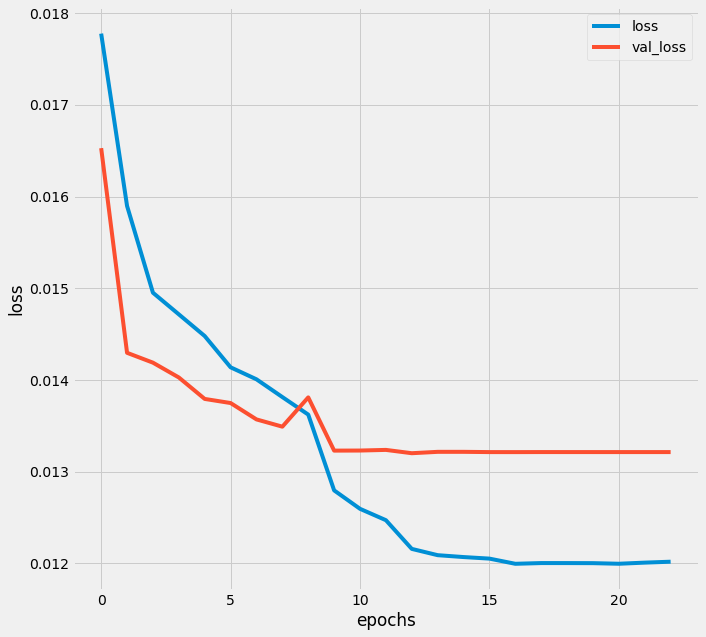

In [110]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [111]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.1075642304638954
        Test RMSE: 0.11495235017983517
        
        Training R2: 0.6236401361193444
        Test R2: 0.5751449522479062
        
        Training Mean Absolute Error: 0.07214537628602624
        Test Mean Absolute Error: 0.07600528225086559
    


# Neural network 7

Changing early stopper patience from 10 to 5 to further reduce overfitting

In [112]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dropout(0.3), # Dropout layer
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=5)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 42s 43ms/step - loss: 0.0178 - mae: 0.0893 - root_mean_squared_error: 0.1333 - val_loss: 0.0146 - val_mae: 0.0826 - val_root_mean_squared_error: 0.1207 - lr: 0.0010
Epoch 2/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0156 - mae: 0.0837 - root_mean_squared_error: 0.1247 - val_loss: 0.0145 - val_mae: 0.0850 - val_root_mean_squared_error: 0.1205 - lr: 0.0010
Epoch 3/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0149 - mae: 0.0824 - root_mean_squared_error: 0.1221 - val_loss: 0.0141 - val_mae: 0.0775 - val_root_mean_squared_error: 0.1189 - lr: 0.0010
Epoch 4/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0146 - mae: 0.0815 - root_mean_squared_error: 0.1209 - val_loss: 0.0137 - val_mae: 0.0770 - val_root_mean_squared_error: 0.1169 - lr: 0.0010
Epoch 5/50
942/942 [==============================] - 7s 7ms/step - loss: 0.0144 - mae: 0.0812 - root_mean_squared_error: 0.1202 -

Plotting loss

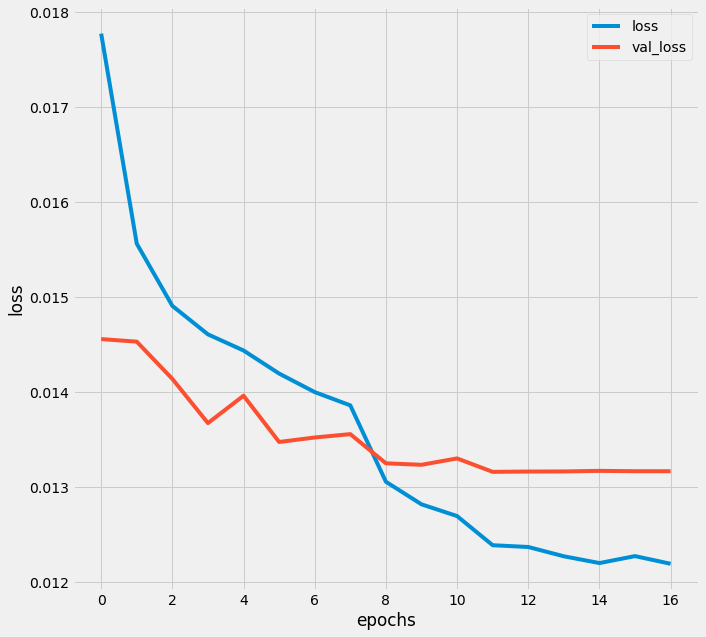

In [113]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

Evaluating train and test data

In [114]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.108480831836859
        Test RMSE: 0.11473601775253098
        
        Training R2: 0.6171985561590365
        Test R2: 0.5767425435891407
        
        Training Mean Absolute Error: 0.07281186121160638
        Test Mean Absolute Error: 0.07589757593361632
    


# Saving Final Neural Network (HDF5)

In [115]:
import os

save_path = "."
model.save(os.path.join(save_path,"network.h5"))

# To load:
#from tensorflow.keras.models import load_model
#loaded_model = load_model(os.path.join(save_path,"network.h5"))